In [12]:
# go through all files in dataset_v3_timestamps, write each dictionary on a new line in a new json file
import json
import os
from tqdm import tqdm 
import shutil
import random

# get all files in dataset_v3_timestamps
DIR_FOLDER = "dataset_v3_validation"
files = os.listdir(DIR_FOLDER)
dataset = []

for file in tqdm(files):
    with open(DIR_FOLDER + "/" + file, 'r') as f2:
        data = json.load(f2)
        dataset.append(data)

for each in dataset:
    prompt = each['prompt']
    prompt = prompt.replace("Given summarizations we want to know the keyword for each summary in the list.\n\n", "").replace("\n\n\n###\n\nKEYWORDS:\n", "\n\n###\n\n")
    each["prompt"] = prompt
    each["completion"] = " " + each["completion"][:-1] + "\n\n###"

100%|██████████| 874/874 [00:04<00:00, 203.63it/s]


In [16]:
print(len(dataset))
for idx, each in enumerate(dataset):

    prompt_list = each["prompt"].split("\n")
    max_digit = 0
    for each_str in prompt_list: 
        if each_str.split(".")[0].isdigit():
            if int(each_str.split(".")[0]) > max_digit:
                max_digit = int(each_str.split(".")[0])
    
    completion_list = each["completion"].split("\n")
    max_digit_completion = 0
    for each_str in completion_list:
        if each_str.split(".")[0].strip().isdigit():
            if int(each_str.split(".")[0]) > max_digit_completion:
                max_digit_completion = int(each_str.split(".")[0])

    if max_digit != max_digit_completion:
        print(completion_list)
        print(max_digit, max_digit_completion)
        print(each["prompt"], each["completion"])
        break

    # strip each str in completion_list 
    for index, each_str in enumerate(completion_list):
        completion_list[index] = each_str.strip()
        if completion_list[index].split(".")[0].isdigit():
            if len(".".join(completion_list[index].split(".")[1:]).strip()) < 2: 
                # pop idx from dataset
                dataset.pop(idx)
    
    # check if www. is in any in completion_list then pop idx 
    for each_str in completion_list:
        if "www." in each_str or len(each_str) > 100:
            dataset.pop(idx)

print(len(dataset))

774
774


In [17]:
# Take each dictionary in dataset, write it on a new line in a new json file
with open('dataset_v3_timestamps_validation.json', 'w') as f:
    for data in tqdm(dataset):
        json.dump(data, f)
        f.write('\n')

100%|██████████| 774/774 [00:00<00:00, 17971.71it/s]


In [ ]:
# run in terminal:
# openai -k $os.environ[API_KEY] api fine_tunes.create -t dataset_v3_timestamps.json -v dataset_v3_timestamps_val.json -m babbage --suffix "timestamps_v2" --n_epochs 4


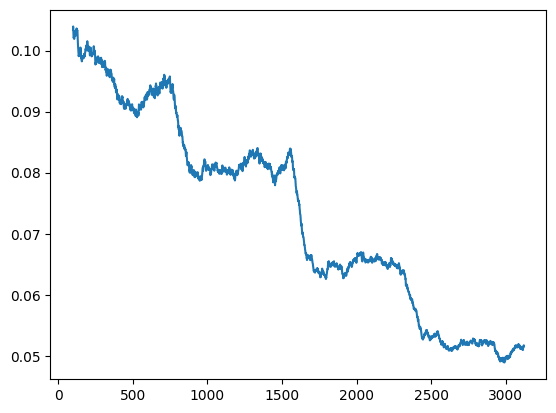

In [27]:
!openai -k $os.environ[API_KEY] api fine_tunes.results -i ft-kDU83NwdbsZgiWo25FeEGoU6 > result.csv

# 
# improved finetuning ft-kDU83NwdbsZgiWo25FeEGoU6
# load result.csv 
import pandas as pd
df = pd.read_csv("result.csv")

# print df in nice format 
pd.set_option('display.max_colwidth', None)
# plot df training_loss vs df step

import matplotlib.pyplot as plt
# plot moving average of training loss
df["training_loss"] = df["training_loss"].rolling(100).mean()
plt.plot(df["step"], df["training_loss"])
plt.show()

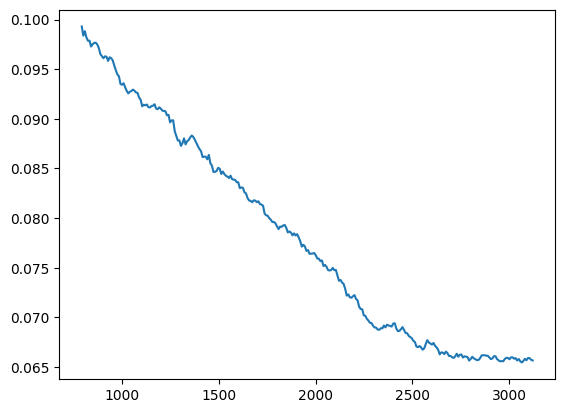

In [28]:
# take out all validation losses that aren't NaN
df = df[df["validation_loss"].notna()]
# plot moving average of validation loss
df["validation_loss"] = df["validation_loss"].rolling(100).mean()
plt.plot(df["step"], df["validation_loss"])
plt.show()

In [110]:
# open dataset_v3_timestamps.json print prompt and completion
import json
import os
from tqdm import tqdm

# print prompt, completion for each line in dataset_v3_timestamps_val.json
with open('dataset_v3_timestamps.json', 'r') as f:
    for line in tqdm(f):
        data = json.loads(line)
        print(data['prompt'])
        print(data['completion'])
        print("\n\n\n")


3632it [00:00, 24775.50it/s]

1. Ellie shares with you the essay memorization framework that she used in her third year at Cambridge University. The method should work for most essay based subjects but even if your subject is an essay based I hope you find this video useful.
2. The creation state is to create a large number of really really good essay plans that you can then memorize in the memorization stage and regurgitate onto paper during your exam. The idea is that by the time the exam rolls around you'll have memorized so many essay plans. that a lot of them will just come up in the exam anyway because you've predicted the titles and you'll just be able toRegurgitate stuff from your brain onto the paper.
3. How to choose the right essay titles and how to plan the essay. How to make sure your essay plan is really really good. Tips on how to prepare for the exam and what to look out for.
4. After making a list of what essays we're going to plan we then need to actually plan those essays. This is the fun part th